# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

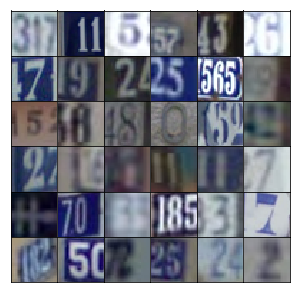

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [21]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [33]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x,64,5,strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1,128,5,strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d(x2,256,5,strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [34]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [35]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [36]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [37]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [38]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [44]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 100
epochs = 50
alpha = 0.2
beta1 = 0.9

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/50... Discriminator Loss: 0.0590... Generator Loss: 18.9520
Epoch 1/50... Discriminator Loss: 0.2404... Generator Loss: 20.4770
Epoch 1/50... Discriminator Loss: 0.0088... Generator Loss: 8.9704
Epoch 1/50... Discriminator Loss: 0.0349... Generator Loss: 14.9351
Epoch 1/50... Discriminator Loss: 0.0614... Generator Loss: 6.1203
Epoch 1/50... Discriminator Loss: 0.1394... Generator Loss: 5.4378
Epoch 1/50... Discriminator Loss: 0.0472... Generator Loss: 5.2725
Epoch 1/50... Discriminator Loss: 0.1251... Generator Loss: 3.5109
Epoch 1/50... Discriminator Loss: 0.0113... Generator Loss: 5.6065
Epoch 1/50... Discriminator Loss: 0.0256... Generator Loss: 6.5896


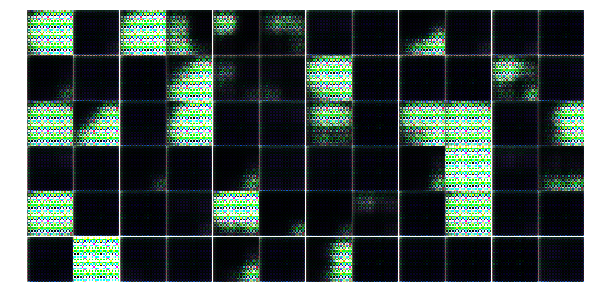

Epoch 1/50... Discriminator Loss: 0.0067... Generator Loss: 9.7152
Epoch 1/50... Discriminator Loss: 0.0060... Generator Loss: 7.3698
Epoch 1/50... Discriminator Loss: 0.0058... Generator Loss: 7.9608
Epoch 1/50... Discriminator Loss: 0.0047... Generator Loss: 6.8135
Epoch 1/50... Discriminator Loss: 0.0107... Generator Loss: 5.8995
Epoch 1/50... Discriminator Loss: 0.0062... Generator Loss: 5.7724
Epoch 1/50... Discriminator Loss: 0.0015... Generator Loss: 8.5782
Epoch 1/50... Discriminator Loss: 0.0090... Generator Loss: 5.5386
Epoch 1/50... Discriminator Loss: 0.0014... Generator Loss: 8.0548
Epoch 1/50... Discriminator Loss: 0.0001... Generator Loss: 11.3620


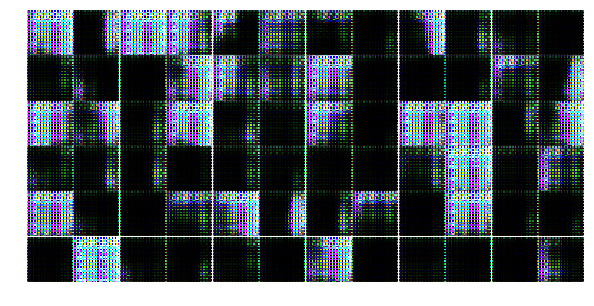

Epoch 1/50... Discriminator Loss: 0.0010... Generator Loss: 9.2735
Epoch 1/50... Discriminator Loss: 0.0007... Generator Loss: 10.3034
Epoch 1/50... Discriminator Loss: 0.0010... Generator Loss: 9.6786
Epoch 1/50... Discriminator Loss: 0.0008... Generator Loss: 10.1916
Epoch 1/50... Discriminator Loss: 0.0050... Generator Loss: 7.6603
Epoch 1/50... Discriminator Loss: 0.0007... Generator Loss: 12.9964
Epoch 1/50... Discriminator Loss: 0.0051... Generator Loss: 7.4870
Epoch 1/50... Discriminator Loss: 0.0188... Generator Loss: 6.9788
Epoch 1/50... Discriminator Loss: 0.0507... Generator Loss: 3.5673
Epoch 1/50... Discriminator Loss: 0.1300... Generator Loss: 7.0136


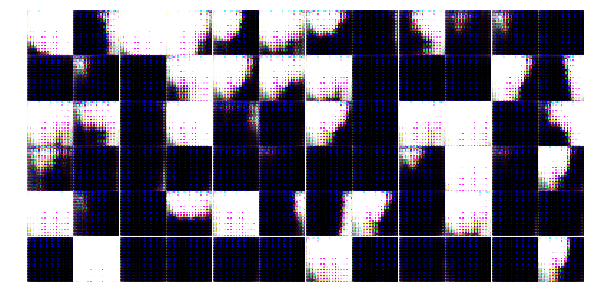

Epoch 1/50... Discriminator Loss: 0.0129... Generator Loss: 6.1189
Epoch 1/50... Discriminator Loss: 0.0036... Generator Loss: 7.5093
Epoch 1/50... Discriminator Loss: 0.0059... Generator Loss: 6.0829
Epoch 1/50... Discriminator Loss: 0.1948... Generator Loss: 2.0759
Epoch 1/50... Discriminator Loss: 0.0000... Generator Loss: 17.9625
Epoch 1/50... Discriminator Loss: 0.0000... Generator Loss: 14.5114
Epoch 1/50... Discriminator Loss: 0.0101... Generator Loss: 6.1570
Epoch 1/50... Discriminator Loss: 0.0143... Generator Loss: 5.2769
Epoch 1/50... Discriminator Loss: 0.1518... Generator Loss: 20.7201
Epoch 1/50... Discriminator Loss: 0.1031... Generator Loss: 4.0694


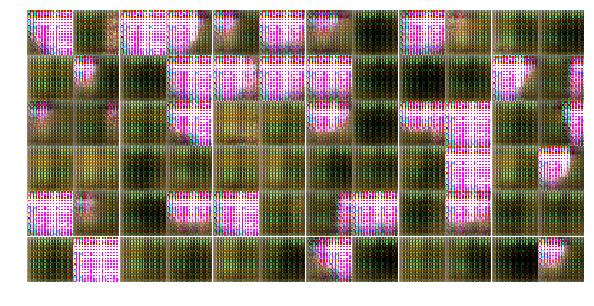

Epoch 1/50... Discriminator Loss: 0.0266... Generator Loss: 5.1024
Epoch 1/50... Discriminator Loss: 0.0428... Generator Loss: 4.9477
Epoch 1/50... Discriminator Loss: 0.0655... Generator Loss: 7.6717
Epoch 1/50... Discriminator Loss: 0.0985... Generator Loss: 9.5294
Epoch 1/50... Discriminator Loss: 0.0005... Generator Loss: 10.6786
Epoch 1/50... Discriminator Loss: 0.0030... Generator Loss: 7.2923
Epoch 1/50... Discriminator Loss: 0.0210... Generator Loss: 4.6347
Epoch 1/50... Discriminator Loss: 0.0334... Generator Loss: 4.7618
Epoch 1/50... Discriminator Loss: 0.0750... Generator Loss: 9.3799
Epoch 1/50... Discriminator Loss: 0.0021... Generator Loss: 16.4335


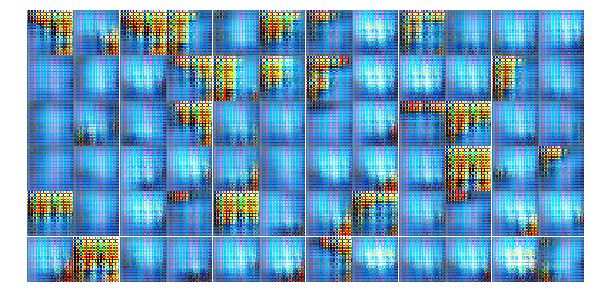

Epoch 1/50... Discriminator Loss: 0.0015... Generator Loss: 7.1502
Epoch 1/50... Discriminator Loss: 0.0000... Generator Loss: 17.0056
Epoch 1/50... Discriminator Loss: 0.0008... Generator Loss: 10.0633
Epoch 1/50... Discriminator Loss: 0.0285... Generator Loss: 5.9042
Epoch 1/50... Discriminator Loss: 0.0098... Generator Loss: 7.3207
Epoch 1/50... Discriminator Loss: 0.0109... Generator Loss: 5.7144
Epoch 1/50... Discriminator Loss: 0.0015... Generator Loss: 9.6511
Epoch 1/50... Discriminator Loss: 0.0000... Generator Loss: 22.6068
Epoch 1/50... Discriminator Loss: 0.0024... Generator Loss: 9.2969
Epoch 1/50... Discriminator Loss: 0.0106... Generator Loss: 5.8670


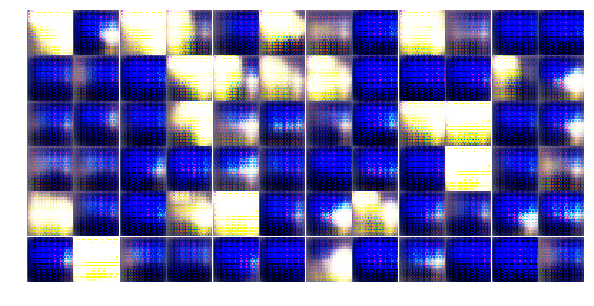

Epoch 1/50... Discriminator Loss: 0.0893... Generator Loss: 3.8528
Epoch 1/50... Discriminator Loss: 0.0000... Generator Loss: 11.1367
Epoch 1/50... Discriminator Loss: 0.0112... Generator Loss: 16.0122
Epoch 1/50... Discriminator Loss: 0.1791... Generator Loss: 2.4201
Epoch 1/50... Discriminator Loss: 0.0175... Generator Loss: 6.4567
Epoch 1/50... Discriminator Loss: 0.2852... Generator Loss: 4.3429
Epoch 1/50... Discriminator Loss: 0.0011... Generator Loss: 12.6054
Epoch 1/50... Discriminator Loss: 0.0069... Generator Loss: 10.2605
Epoch 1/50... Discriminator Loss: 0.0295... Generator Loss: 4.8717
Epoch 1/50... Discriminator Loss: 0.0294... Generator Loss: 4.9788


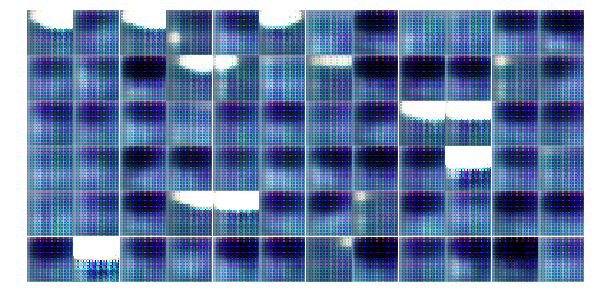

Epoch 1/50... Discriminator Loss: 0.1165... Generator Loss: 8.2964
Epoch 1/50... Discriminator Loss: 0.1080... Generator Loss: 5.0292
Epoch 1/50... Discriminator Loss: 0.2811... Generator Loss: 3.2834
Epoch 2/50... Discriminator Loss: 0.0114... Generator Loss: 6.6759
Epoch 2/50... Discriminator Loss: 0.0176... Generator Loss: 6.8511
Epoch 2/50... Discriminator Loss: 0.0875... Generator Loss: 6.0063
Epoch 2/50... Discriminator Loss: 0.0002... Generator Loss: 11.2651
Epoch 2/50... Discriminator Loss: 0.0493... Generator Loss: 6.7481
Epoch 2/50... Discriminator Loss: 0.0134... Generator Loss: 5.6239
Epoch 2/50... Discriminator Loss: 0.0000... Generator Loss: 17.1454


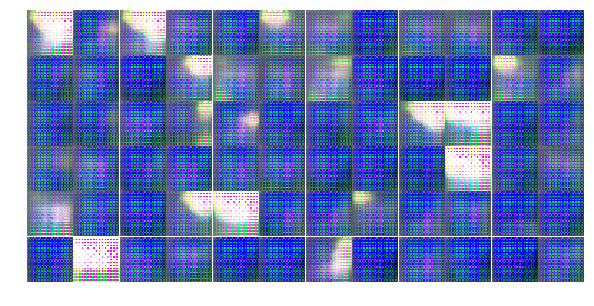

Epoch 2/50... Discriminator Loss: 0.1128... Generator Loss: 3.3515
Epoch 2/50... Discriminator Loss: 0.0249... Generator Loss: 5.7097
Epoch 2/50... Discriminator Loss: 0.2627... Generator Loss: 7.3200
Epoch 2/50... Discriminator Loss: 0.0108... Generator Loss: 9.9210
Epoch 2/50... Discriminator Loss: 0.0119... Generator Loss: 8.8496
Epoch 2/50... Discriminator Loss: 0.0045... Generator Loss: 9.7762
Epoch 2/50... Discriminator Loss: 0.0925... Generator Loss: 3.5303
Epoch 2/50... Discriminator Loss: 0.1145... Generator Loss: 5.5894
Epoch 2/50... Discriminator Loss: 0.0012... Generator Loss: 12.4374
Epoch 2/50... Discriminator Loss: 0.2142... Generator Loss: 3.3184


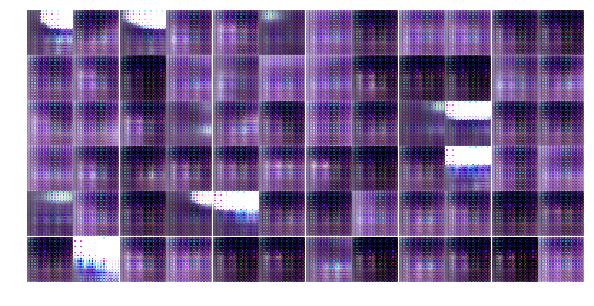

Epoch 2/50... Discriminator Loss: 0.0557... Generator Loss: 5.9058
Epoch 2/50... Discriminator Loss: 0.0810... Generator Loss: 11.4546
Epoch 2/50... Discriminator Loss: 0.1038... Generator Loss: 4.9590
Epoch 2/50... Discriminator Loss: 2.0282... Generator Loss: 1.7790
Epoch 2/50... Discriminator Loss: 0.4705... Generator Loss: 2.1132
Epoch 2/50... Discriminator Loss: 0.8571... Generator Loss: 7.5795
Epoch 2/50... Discriminator Loss: 0.2563... Generator Loss: 3.5541
Epoch 2/50... Discriminator Loss: 0.0667... Generator Loss: 4.1698
Epoch 2/50... Discriminator Loss: 0.0078... Generator Loss: 7.4519
Epoch 2/50... Discriminator Loss: 0.0025... Generator Loss: 9.6497


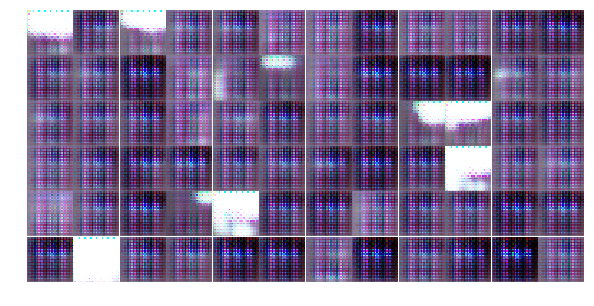

Epoch 2/50... Discriminator Loss: 0.0826... Generator Loss: 6.0755
Epoch 2/50... Discriminator Loss: 0.0081... Generator Loss: 6.5977
Epoch 2/50... Discriminator Loss: 0.1419... Generator Loss: 4.6422
Epoch 2/50... Discriminator Loss: 0.1124... Generator Loss: 3.3454
Epoch 2/50... Discriminator Loss: 0.1906... Generator Loss: 3.4421
Epoch 2/50... Discriminator Loss: 0.1186... Generator Loss: 3.4851
Epoch 2/50... Discriminator Loss: 0.1409... Generator Loss: 6.2347
Epoch 2/50... Discriminator Loss: 0.0168... Generator Loss: 5.0477
Epoch 2/50... Discriminator Loss: 0.3086... Generator Loss: 3.5315
Epoch 2/50... Discriminator Loss: 0.0717... Generator Loss: 7.7176


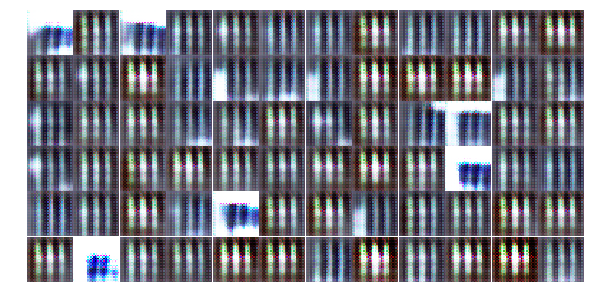

Epoch 2/50... Discriminator Loss: 0.7014... Generator Loss: 1.6863
Epoch 2/50... Discriminator Loss: 0.3391... Generator Loss: 3.4109
Epoch 2/50... Discriminator Loss: 0.3537... Generator Loss: 2.7868
Epoch 2/50... Discriminator Loss: 0.0586... Generator Loss: 3.4258
Epoch 2/50... Discriminator Loss: 0.0914... Generator Loss: 3.5497
Epoch 2/50... Discriminator Loss: 0.0251... Generator Loss: 6.1883
Epoch 2/50... Discriminator Loss: 0.0114... Generator Loss: 4.8559
Epoch 2/50... Discriminator Loss: 0.0263... Generator Loss: 4.0174
Epoch 2/50... Discriminator Loss: 0.0147... Generator Loss: 6.4291
Epoch 2/50... Discriminator Loss: 1.3515... Generator Loss: 0.6535


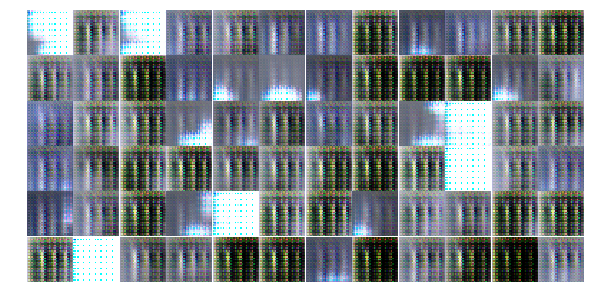

Epoch 2/50... Discriminator Loss: 0.3927... Generator Loss: 2.2715
Epoch 2/50... Discriminator Loss: 0.1500... Generator Loss: 3.0806
Epoch 2/50... Discriminator Loss: 0.0975... Generator Loss: 7.6228
Epoch 2/50... Discriminator Loss: 0.4865... Generator Loss: 1.4495
Epoch 2/50... Discriminator Loss: 0.1131... Generator Loss: 3.9346
Epoch 2/50... Discriminator Loss: 0.0729... Generator Loss: 5.3536
Epoch 2/50... Discriminator Loss: 0.0951... Generator Loss: 2.9927
Epoch 2/50... Discriminator Loss: 0.0259... Generator Loss: 5.3345
Epoch 2/50... Discriminator Loss: 0.0306... Generator Loss: 3.9633
Epoch 2/50... Discriminator Loss: 0.2544... Generator Loss: 6.1505


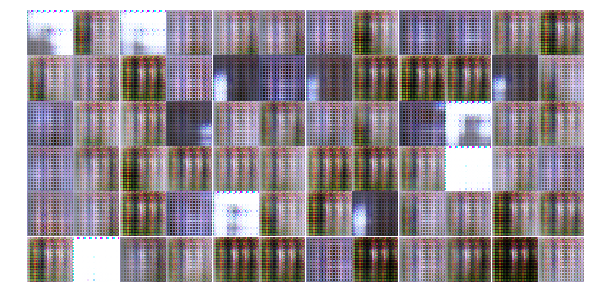

Epoch 2/50... Discriminator Loss: 0.2768... Generator Loss: 2.8017
Epoch 2/50... Discriminator Loss: 0.0103... Generator Loss: 5.6453
Epoch 2/50... Discriminator Loss: 0.4439... Generator Loss: 1.4753
Epoch 2/50... Discriminator Loss: 0.1531... Generator Loss: 2.6614
Epoch 2/50... Discriminator Loss: 0.6388... Generator Loss: 3.5598
Epoch 2/50... Discriminator Loss: 0.1548... Generator Loss: 3.7519
Epoch 2/50... Discriminator Loss: 0.1646... Generator Loss: 3.2891
Epoch 2/50... Discriminator Loss: 0.7001... Generator Loss: 1.8003
Epoch 2/50... Discriminator Loss: 0.3563... Generator Loss: 4.7620
Epoch 2/50... Discriminator Loss: 0.0081... Generator Loss: 7.2754


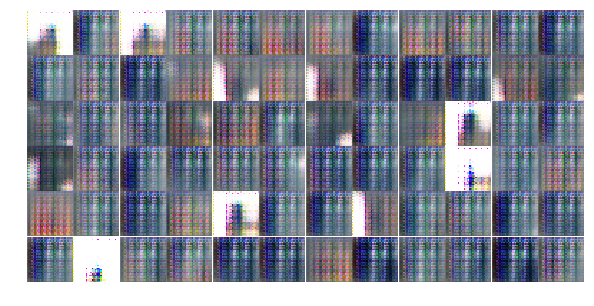

Epoch 2/50... Discriminator Loss: 0.0250... Generator Loss: 4.4784
Epoch 2/50... Discriminator Loss: 0.0776... Generator Loss: 4.8621
Epoch 2/50... Discriminator Loss: 0.2034... Generator Loss: 3.9567
Epoch 2/50... Discriminator Loss: 0.0898... Generator Loss: 3.6271
Epoch 2/50... Discriminator Loss: 0.0833... Generator Loss: 3.7708
Epoch 2/50... Discriminator Loss: 0.1790... Generator Loss: 2.2051
Epoch 3/50... Discriminator Loss: 0.1021... Generator Loss: 2.9514
Epoch 3/50... Discriminator Loss: 0.1917... Generator Loss: 3.2285
Epoch 3/50... Discriminator Loss: 0.0596... Generator Loss: 4.6803
Epoch 3/50... Discriminator Loss: 0.0973... Generator Loss: 3.4602


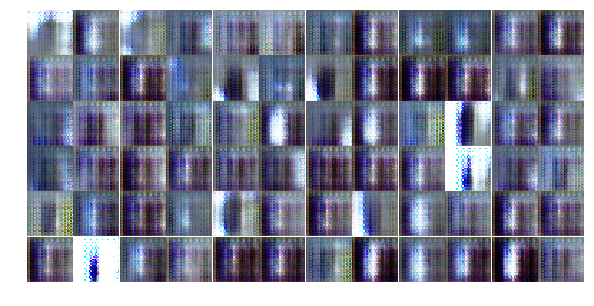

Epoch 3/50... Discriminator Loss: 0.1405... Generator Loss: 4.3711
Epoch 3/50... Discriminator Loss: 0.0472... Generator Loss: 4.9335
Epoch 3/50... Discriminator Loss: 0.0673... Generator Loss: 4.4491
Epoch 3/50... Discriminator Loss: 0.1063... Generator Loss: 4.2182
Epoch 3/50... Discriminator Loss: 0.0161... Generator Loss: 5.6520
Epoch 3/50... Discriminator Loss: 0.0024... Generator Loss: 9.3991
Epoch 3/50... Discriminator Loss: 0.0146... Generator Loss: 6.0619
Epoch 3/50... Discriminator Loss: 0.2042... Generator Loss: 2.8769
Epoch 3/50... Discriminator Loss: 1.2259... Generator Loss: 8.0656
Epoch 3/50... Discriminator Loss: 0.0046... Generator Loss: 6.4272


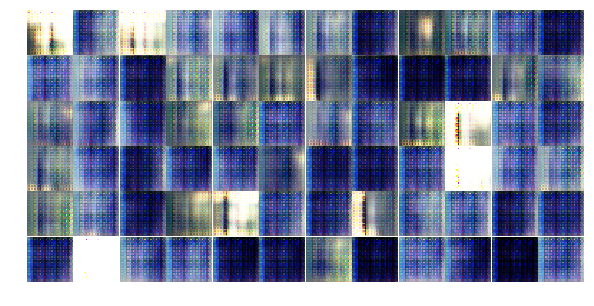

Epoch 3/50... Discriminator Loss: 0.0352... Generator Loss: 4.9551
Epoch 3/50... Discriminator Loss: 0.1040... Generator Loss: 4.0164
Epoch 3/50... Discriminator Loss: 0.1720... Generator Loss: 2.1480
Epoch 3/50... Discriminator Loss: 0.3803... Generator Loss: 1.7201
Epoch 3/50... Discriminator Loss: 1.4570... Generator Loss: 0.6325
Epoch 3/50... Discriminator Loss: 0.0539... Generator Loss: 10.7557
Epoch 3/50... Discriminator Loss: 1.2245... Generator Loss: 4.6178
Epoch 3/50... Discriminator Loss: 0.3057... Generator Loss: 6.6775
Epoch 3/50... Discriminator Loss: 0.0436... Generator Loss: 5.1164
Epoch 3/50... Discriminator Loss: 0.2863... Generator Loss: 2.4343


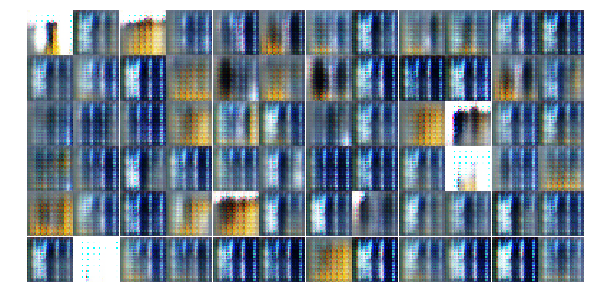

Epoch 3/50... Discriminator Loss: 0.1453... Generator Loss: 2.6769
Epoch 3/50... Discriminator Loss: 0.3865... Generator Loss: 7.2534
Epoch 3/50... Discriminator Loss: 0.0438... Generator Loss: 4.3890
Epoch 3/50... Discriminator Loss: 0.3600... Generator Loss: 1.6074
Epoch 3/50... Discriminator Loss: 0.1519... Generator Loss: 2.8275
Epoch 3/50... Discriminator Loss: 0.2273... Generator Loss: 3.2422
Epoch 3/50... Discriminator Loss: 0.1360... Generator Loss: 2.8798
Epoch 3/50... Discriminator Loss: 0.7930... Generator Loss: 1.2054
Epoch 3/50... Discriminator Loss: 0.0078... Generator Loss: 5.7213
Epoch 3/50... Discriminator Loss: 0.3222... Generator Loss: 2.7350


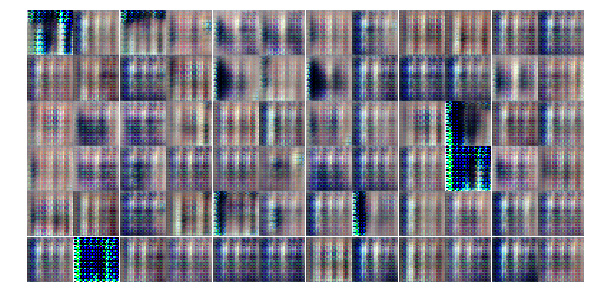

Epoch 3/50... Discriminator Loss: 0.5336... Generator Loss: 7.7184
Epoch 3/50... Discriminator Loss: 0.4334... Generator Loss: 2.1063
Epoch 3/50... Discriminator Loss: 0.2696... Generator Loss: 8.9574
Epoch 3/50... Discriminator Loss: 0.2373... Generator Loss: 4.9188
Epoch 3/50... Discriminator Loss: 0.0628... Generator Loss: 4.2847
Epoch 3/50... Discriminator Loss: 0.3043... Generator Loss: 3.1991
Epoch 3/50... Discriminator Loss: 0.6893... Generator Loss: 8.4504
Epoch 3/50... Discriminator Loss: 0.2545... Generator Loss: 5.0553
Epoch 3/50... Discriminator Loss: 0.3713... Generator Loss: 1.9437
Epoch 3/50... Discriminator Loss: 0.0517... Generator Loss: 4.9765


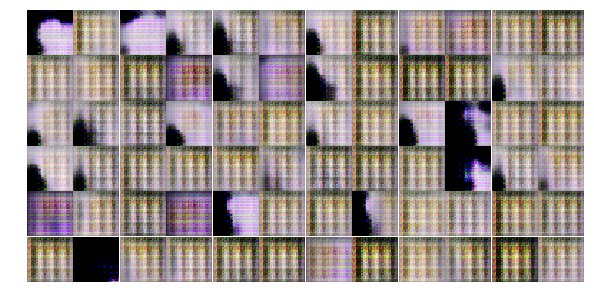

Epoch 3/50... Discriminator Loss: 0.0895... Generator Loss: 4.9130
Epoch 3/50... Discriminator Loss: 0.2560... Generator Loss: 3.5652
Epoch 3/50... Discriminator Loss: 0.1676... Generator Loss: 3.7724
Epoch 3/50... Discriminator Loss: 0.1473... Generator Loss: 5.8846
Epoch 3/50... Discriminator Loss: 0.1006... Generator Loss: 3.1254
Epoch 3/50... Discriminator Loss: 0.0807... Generator Loss: 3.2698
Epoch 3/50... Discriminator Loss: 0.1889... Generator Loss: 2.8362
Epoch 3/50... Discriminator Loss: 0.2810... Generator Loss: 4.0530
Epoch 3/50... Discriminator Loss: 0.1768... Generator Loss: 3.2360
Epoch 3/50... Discriminator Loss: 0.1793... Generator Loss: 3.4298


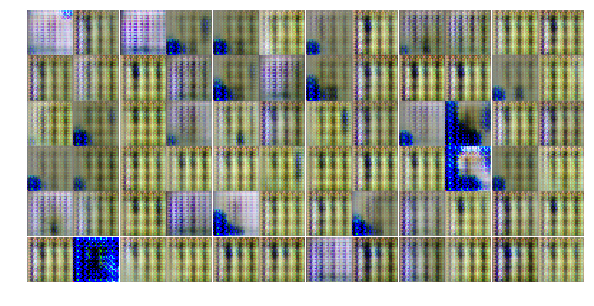

Epoch 3/50... Discriminator Loss: 0.0869... Generator Loss: 4.4992
Epoch 3/50... Discriminator Loss: 0.0165... Generator Loss: 6.8203
Epoch 3/50... Discriminator Loss: 0.0476... Generator Loss: 4.4878
Epoch 3/50... Discriminator Loss: 0.1079... Generator Loss: 3.0939
Epoch 3/50... Discriminator Loss: 0.2282... Generator Loss: 4.6836
Epoch 3/50... Discriminator Loss: 0.2512... Generator Loss: 2.5155
Epoch 3/50... Discriminator Loss: 0.0656... Generator Loss: 3.9154
Epoch 3/50... Discriminator Loss: 0.0407... Generator Loss: 5.5734
Epoch 3/50... Discriminator Loss: 0.1537... Generator Loss: 5.2949
Epoch 3/50... Discriminator Loss: 0.1170... Generator Loss: 3.9584


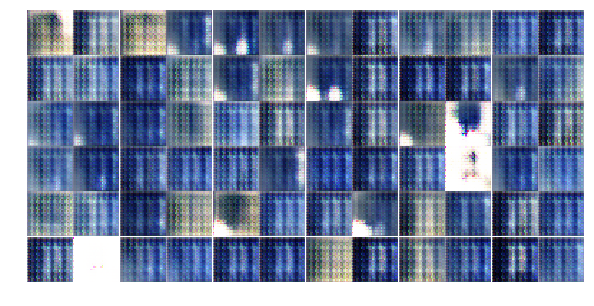

Epoch 3/50... Discriminator Loss: 0.2863... Generator Loss: 4.4683
Epoch 3/50... Discriminator Loss: 1.4775... Generator Loss: 5.6299
Epoch 3/50... Discriminator Loss: 0.1303... Generator Loss: 4.5702
Epoch 3/50... Discriminator Loss: 0.7065... Generator Loss: 1.4390
Epoch 3/50... Discriminator Loss: 0.0086... Generator Loss: 6.4238
Epoch 3/50... Discriminator Loss: 0.1273... Generator Loss: 3.1437
Epoch 3/50... Discriminator Loss: 0.2886... Generator Loss: 7.1819
Epoch 3/50... Discriminator Loss: 0.3331... Generator Loss: 2.5975
Epoch 3/50... Discriminator Loss: 0.8799... Generator Loss: 1.6573
Epoch 4/50... Discriminator Loss: 0.8212... Generator Loss: 1.7979


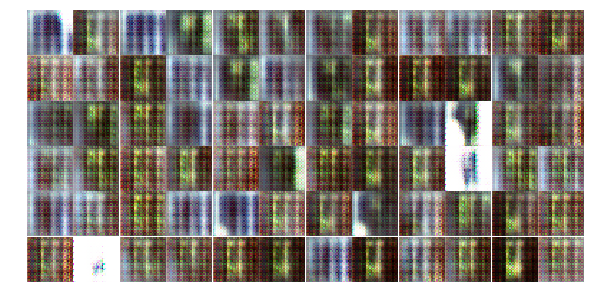

Epoch 4/50... Discriminator Loss: 0.2586... Generator Loss: 4.8862
Epoch 4/50... Discriminator Loss: 0.6075... Generator Loss: 7.7339
Epoch 4/50... Discriminator Loss: 0.5974... Generator Loss: 2.7054
Epoch 4/50... Discriminator Loss: 0.3778... Generator Loss: 6.0533
Epoch 4/50... Discriminator Loss: 0.0680... Generator Loss: 3.7473
Epoch 4/50... Discriminator Loss: 0.0933... Generator Loss: 2.9524
Epoch 4/50... Discriminator Loss: 0.0709... Generator Loss: 5.6766
Epoch 4/50... Discriminator Loss: 0.3472... Generator Loss: 2.9240
Epoch 4/50... Discriminator Loss: 0.0615... Generator Loss: 6.6239
Epoch 4/50... Discriminator Loss: 0.2718... Generator Loss: 2.1937


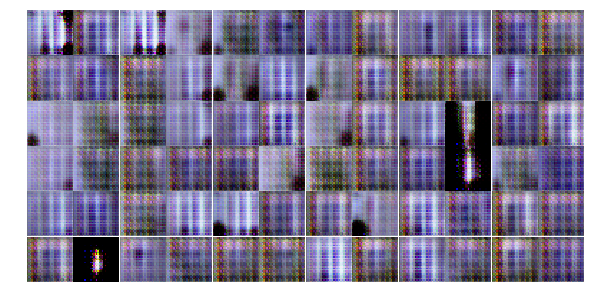

Epoch 4/50... Discriminator Loss: 0.1044... Generator Loss: 8.9616
Epoch 4/50... Discriminator Loss: 0.1960... Generator Loss: 6.9788
Epoch 4/50... Discriminator Loss: 0.1235... Generator Loss: 3.7906
Epoch 4/50... Discriminator Loss: 0.1490... Generator Loss: 4.7143
Epoch 4/50... Discriminator Loss: 0.2987... Generator Loss: 4.7212
Epoch 4/50... Discriminator Loss: 0.4713... Generator Loss: 1.5129
Epoch 4/50... Discriminator Loss: 0.0943... Generator Loss: 5.4291
Epoch 4/50... Discriminator Loss: 0.0955... Generator Loss: 3.7271
Epoch 4/50... Discriminator Loss: 0.1638... Generator Loss: 2.9926
Epoch 4/50... Discriminator Loss: 0.1985... Generator Loss: 7.3713


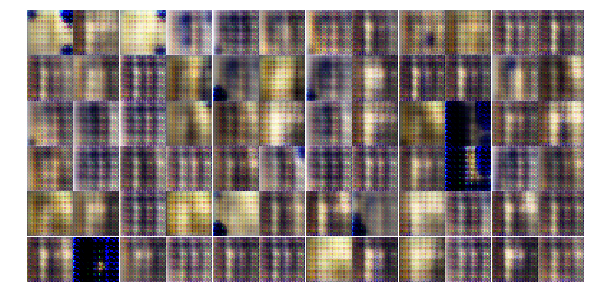

Epoch 4/50... Discriminator Loss: 0.0448... Generator Loss: 4.7250
Epoch 4/50... Discriminator Loss: 0.0515... Generator Loss: 3.8284
Epoch 4/50... Discriminator Loss: 0.3076... Generator Loss: 2.2552
Epoch 4/50... Discriminator Loss: 0.2189... Generator Loss: 3.7557
Epoch 4/50... Discriminator Loss: 0.1861... Generator Loss: 2.8149
Epoch 4/50... Discriminator Loss: 0.2361... Generator Loss: 2.1356
Epoch 4/50... Discriminator Loss: 0.1886... Generator Loss: 2.8830
Epoch 4/50... Discriminator Loss: 0.1251... Generator Loss: 3.5661
Epoch 4/50... Discriminator Loss: 0.1377... Generator Loss: 4.9228
Epoch 4/50... Discriminator Loss: 0.0663... Generator Loss: 4.2819


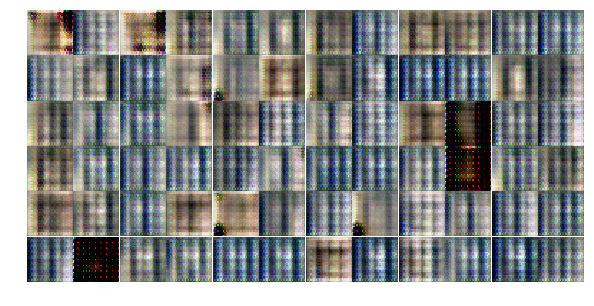

Epoch 4/50... Discriminator Loss: 0.0704... Generator Loss: 4.4480
Epoch 4/50... Discriminator Loss: 0.2758... Generator Loss: 3.7999
Epoch 4/50... Discriminator Loss: 0.1446... Generator Loss: 3.8300
Epoch 4/50... Discriminator Loss: 1.2463... Generator Loss: 0.6191
Epoch 4/50... Discriminator Loss: 0.1781... Generator Loss: 4.5973
Epoch 4/50... Discriminator Loss: 0.4303... Generator Loss: 4.6024
Epoch 4/50... Discriminator Loss: 0.3975... Generator Loss: 3.3567
Epoch 4/50... Discriminator Loss: 0.8022... Generator Loss: 4.2269
Epoch 4/50... Discriminator Loss: 1.2543... Generator Loss: 1.5469
Epoch 4/50... Discriminator Loss: 0.5264... Generator Loss: 2.5124


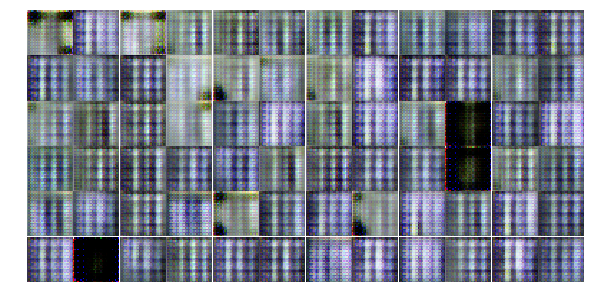

Epoch 4/50... Discriminator Loss: 0.2419... Generator Loss: 2.5801
Epoch 4/50... Discriminator Loss: 0.0586... Generator Loss: 3.6599
Epoch 4/50... Discriminator Loss: 0.1988... Generator Loss: 2.9784
Epoch 4/50... Discriminator Loss: 0.2602... Generator Loss: 2.6073
Epoch 4/50... Discriminator Loss: 0.0119... Generator Loss: 5.3631
Epoch 4/50... Discriminator Loss: 0.1578... Generator Loss: 2.9293
Epoch 4/50... Discriminator Loss: 1.0202... Generator Loss: 1.7212
Epoch 4/50... Discriminator Loss: 1.2589... Generator Loss: 9.1836
Epoch 4/50... Discriminator Loss: 1.3825... Generator Loss: 0.7925
Epoch 4/50... Discriminator Loss: 0.7338... Generator Loss: 3.6963


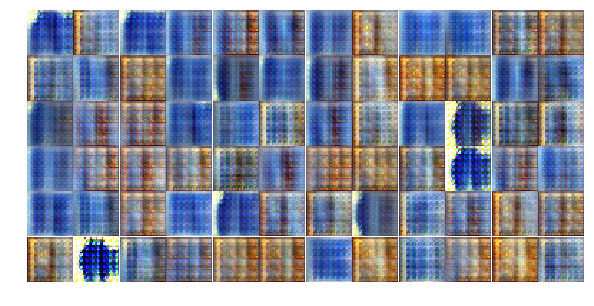

Epoch 4/50... Discriminator Loss: 0.2250... Generator Loss: 4.9982
Epoch 4/50... Discriminator Loss: 0.3016... Generator Loss: 3.1466
Epoch 4/50... Discriminator Loss: 1.1066... Generator Loss: 1.5029
Epoch 4/50... Discriminator Loss: 1.0585... Generator Loss: 2.0214
Epoch 4/50... Discriminator Loss: 2.6096... Generator Loss: 1.8356
Epoch 4/50... Discriminator Loss: 0.5169... Generator Loss: 2.8985
Epoch 4/50... Discriminator Loss: 0.2631... Generator Loss: 3.5125
Epoch 4/50... Discriminator Loss: 0.3763... Generator Loss: 2.1773
Epoch 4/50... Discriminator Loss: 0.1187... Generator Loss: 3.6888
Epoch 4/50... Discriminator Loss: 0.1139... Generator Loss: 4.0136


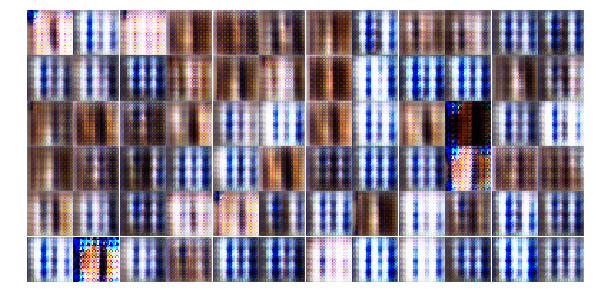

Epoch 4/50... Discriminator Loss: 0.2340... Generator Loss: 4.2232
Epoch 4/50... Discriminator Loss: 0.6800... Generator Loss: 6.8631
Epoch 4/50... Discriminator Loss: 0.1801... Generator Loss: 7.5482
Epoch 4/50... Discriminator Loss: 1.0441... Generator Loss: 3.3154
Epoch 4/50... Discriminator Loss: 2.3453... Generator Loss: 2.4528
Epoch 4/50... Discriminator Loss: 0.3600... Generator Loss: 4.0374
Epoch 4/50... Discriminator Loss: 0.0608... Generator Loss: 4.1218
Epoch 4/50... Discriminator Loss: 0.1460... Generator Loss: 3.5137
Epoch 4/50... Discriminator Loss: 0.3023... Generator Loss: 4.0824
Epoch 4/50... Discriminator Loss: 0.3647... Generator Loss: 2.3014


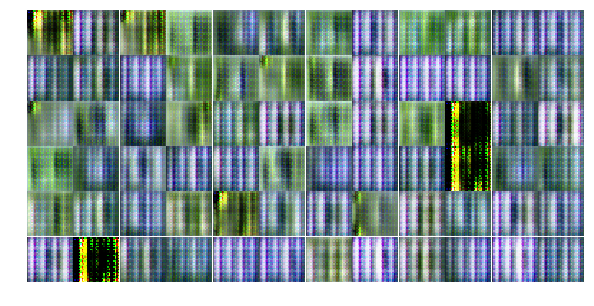

Epoch 4/50... Discriminator Loss: 0.2193... Generator Loss: 2.1611
Epoch 4/50... Discriminator Loss: 0.0583... Generator Loss: 3.6650
Epoch 4/50... Discriminator Loss: 0.0791... Generator Loss: 4.2033
Epoch 5/50... Discriminator Loss: 0.1045... Generator Loss: 2.8976
Epoch 5/50... Discriminator Loss: 0.0465... Generator Loss: 3.9681
Epoch 5/50... Discriminator Loss: 0.1982... Generator Loss: 3.1160
Epoch 5/50... Discriminator Loss: 0.3186... Generator Loss: 3.4216
Epoch 5/50... Discriminator Loss: 0.0740... Generator Loss: 3.9728
Epoch 5/50... Discriminator Loss: 0.1207... Generator Loss: 6.8078
Epoch 5/50... Discriminator Loss: 0.2442... Generator Loss: 2.1546


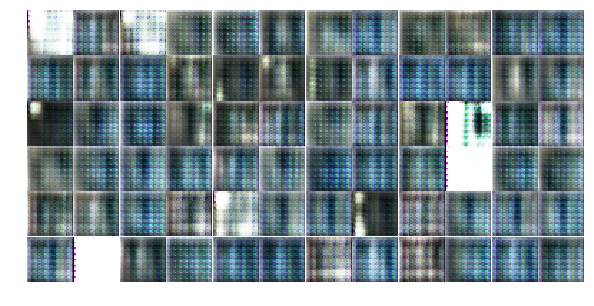

Epoch 5/50... Discriminator Loss: 0.4448... Generator Loss: 1.4679
Epoch 5/50... Discriminator Loss: 0.4178... Generator Loss: 2.2213
Epoch 5/50... Discriminator Loss: 0.3762... Generator Loss: 3.6452
Epoch 5/50... Discriminator Loss: 0.0502... Generator Loss: 3.7047
Epoch 5/50... Discriminator Loss: 0.0480... Generator Loss: 3.7598
Epoch 5/50... Discriminator Loss: 0.2743... Generator Loss: 3.0132
Epoch 5/50... Discriminator Loss: 0.2219... Generator Loss: 3.2425
Epoch 5/50... Discriminator Loss: 1.0229... Generator Loss: 0.8005
Epoch 5/50... Discriminator Loss: 0.2742... Generator Loss: 2.7157
Epoch 5/50... Discriminator Loss: 0.1983... Generator Loss: 2.7904


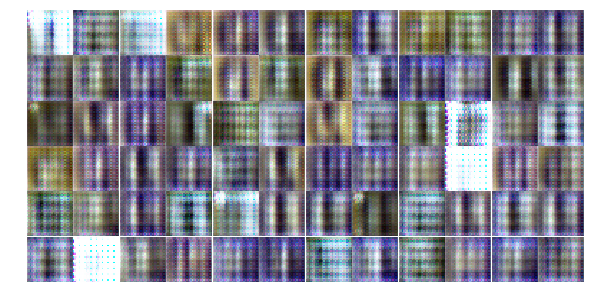

Epoch 5/50... Discriminator Loss: 0.4224... Generator Loss: 2.7926
Epoch 5/50... Discriminator Loss: 0.9210... Generator Loss: 0.8711
Epoch 5/50... Discriminator Loss: 0.7230... Generator Loss: 1.1796
Epoch 5/50... Discriminator Loss: 0.2692... Generator Loss: 2.0128
Epoch 5/50... Discriminator Loss: 0.1894... Generator Loss: 4.1734
Epoch 5/50... Discriminator Loss: 0.4357... Generator Loss: 3.0638
Epoch 5/50... Discriminator Loss: 0.8069... Generator Loss: 1.3329
Epoch 5/50... Discriminator Loss: 0.3955... Generator Loss: 4.5633
Epoch 5/50... Discriminator Loss: 0.1213... Generator Loss: 2.9539
Epoch 5/50... Discriminator Loss: 0.0938... Generator Loss: 3.1799


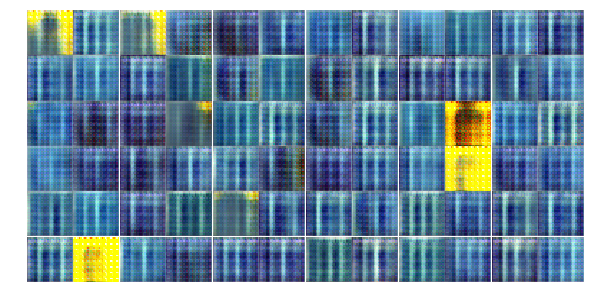

Epoch 5/50... Discriminator Loss: 0.1036... Generator Loss: 3.6589
Epoch 5/50... Discriminator Loss: 0.2545... Generator Loss: 2.9045
Epoch 5/50... Discriminator Loss: 0.2472... Generator Loss: 2.6272
Epoch 5/50... Discriminator Loss: 0.2868... Generator Loss: 2.5214
Epoch 5/50... Discriminator Loss: 0.3492... Generator Loss: 2.3332
Epoch 5/50... Discriminator Loss: 0.5324... Generator Loss: 2.3154
Epoch 5/50... Discriminator Loss: 0.4185... Generator Loss: 1.9199
Epoch 5/50... Discriminator Loss: 0.6511... Generator Loss: 4.6506
Epoch 5/50... Discriminator Loss: 0.2054... Generator Loss: 3.2862
Epoch 5/50... Discriminator Loss: 2.4635... Generator Loss: 0.4120


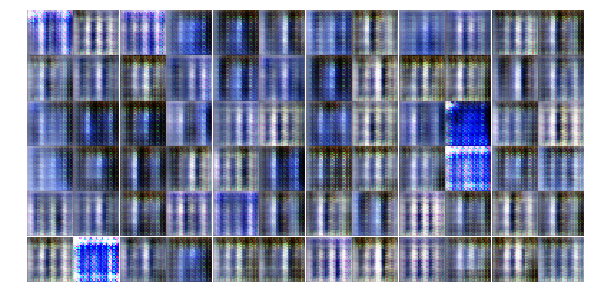

Epoch 5/50... Discriminator Loss: 0.4684... Generator Loss: 2.5285
Epoch 5/50... Discriminator Loss: 0.1655... Generator Loss: 3.0604
Epoch 5/50... Discriminator Loss: 0.5546... Generator Loss: 1.9792
Epoch 5/50... Discriminator Loss: 0.2386... Generator Loss: 5.3348
Epoch 5/50... Discriminator Loss: 0.3190... Generator Loss: 2.6350
Epoch 5/50... Discriminator Loss: 0.6329... Generator Loss: 2.6071
Epoch 5/50... Discriminator Loss: 1.1422... Generator Loss: 1.7778
Epoch 5/50... Discriminator Loss: 0.8608... Generator Loss: 2.3418
Epoch 5/50... Discriminator Loss: 1.2762... Generator Loss: 0.6924
Epoch 5/50... Discriminator Loss: 0.0926... Generator Loss: 3.3413


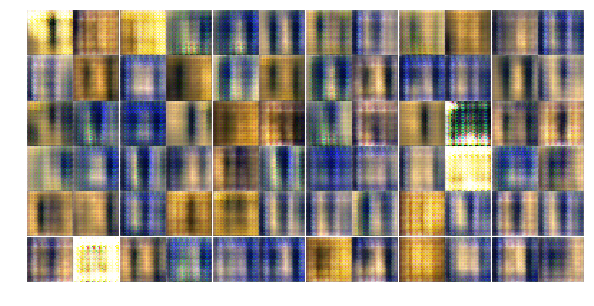

Epoch 5/50... Discriminator Loss: 0.2900... Generator Loss: 2.3302
Epoch 5/50... Discriminator Loss: 0.5083... Generator Loss: 2.7902
Epoch 5/50... Discriminator Loss: 0.3012... Generator Loss: 2.5355
Epoch 5/50... Discriminator Loss: 0.1922... Generator Loss: 2.6758
Epoch 5/50... Discriminator Loss: 0.4323... Generator Loss: 2.7674
Epoch 5/50... Discriminator Loss: 0.3705... Generator Loss: 2.5295
Epoch 5/50... Discriminator Loss: 0.4513... Generator Loss: 2.4767
Epoch 5/50... Discriminator Loss: 0.1085... Generator Loss: 4.1829
Epoch 5/50... Discriminator Loss: 0.5589... Generator Loss: 2.9127
Epoch 5/50... Discriminator Loss: 0.1082... Generator Loss: 3.4829


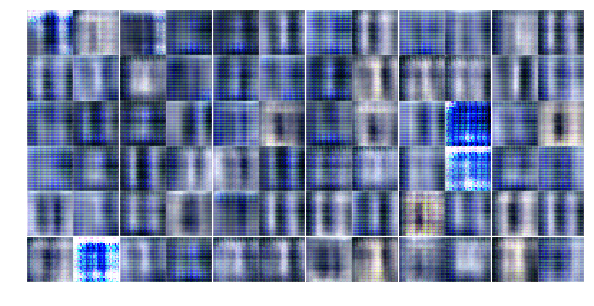

Epoch 5/50... Discriminator Loss: 0.0418... Generator Loss: 4.2854
Epoch 5/50... Discriminator Loss: 1.7085... Generator Loss: 0.4243
Epoch 5/50... Discriminator Loss: 0.4886... Generator Loss: 1.9135
Epoch 5/50... Discriminator Loss: 0.2264... Generator Loss: 3.0410
Epoch 5/50... Discriminator Loss: 1.2841... Generator Loss: 0.5242
Epoch 6/50... Discriminator Loss: 0.3100... Generator Loss: 3.2772
Epoch 6/50... Discriminator Loss: 0.5331... Generator Loss: 3.5785
Epoch 6/50... Discriminator Loss: 0.2305... Generator Loss: 2.3707
Epoch 6/50... Discriminator Loss: 0.1684... Generator Loss: 2.8689
Epoch 6/50... Discriminator Loss: 0.1646... Generator Loss: 2.7917
Epoch 6/50... Discriminator Loss: 0.4308... Generator Loss: 2.1891
Epoch 6/50... Discriminator Loss: 0.0591... Generator Loss: 3.9318
Epoch 6/50... Discriminator Loss: 0.2317... Generator Loss: 3.8703
Epoch 6/50... Discriminator Loss: 0.2120... Generator Loss: 2.9094
Epoch 6/50... Discriminator Loss: 0.3362... Generator Loss: 2.

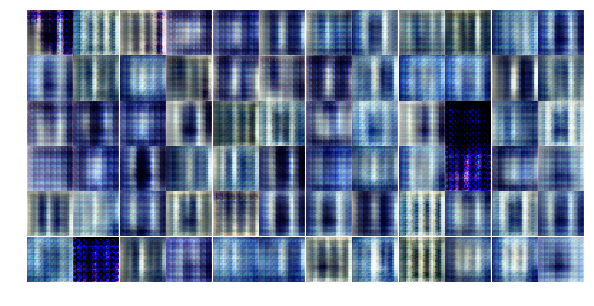

Epoch 6/50... Discriminator Loss: 0.4847... Generator Loss: 2.1052
Epoch 6/50... Discriminator Loss: 0.4450... Generator Loss: 1.5072
Epoch 6/50... Discriminator Loss: 0.8174... Generator Loss: 4.2184
Epoch 6/50... Discriminator Loss: 0.2894... Generator Loss: 1.9490
Epoch 6/50... Discriminator Loss: 0.4416... Generator Loss: 3.6130
Epoch 6/50... Discriminator Loss: 0.9793... Generator Loss: 1.8255
Epoch 6/50... Discriminator Loss: 0.7291... Generator Loss: 3.4713
Epoch 6/50... Discriminator Loss: 0.4952... Generator Loss: 5.4357
Epoch 6/50... Discriminator Loss: 2.3861... Generator Loss: 0.5589
Epoch 6/50... Discriminator Loss: 1.5460... Generator Loss: 0.7324


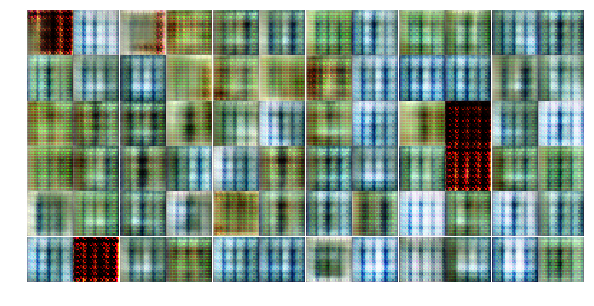

Epoch 6/50... Discriminator Loss: 0.6107... Generator Loss: 1.7673
Epoch 6/50... Discriminator Loss: 0.6254... Generator Loss: 1.3338
Epoch 6/50... Discriminator Loss: 0.2825... Generator Loss: 2.7475
Epoch 6/50... Discriminator Loss: 0.2544... Generator Loss: 3.0313
Epoch 6/50... Discriminator Loss: 0.7947... Generator Loss: 2.5673
Epoch 6/50... Discriminator Loss: 0.2781... Generator Loss: 2.9267
Epoch 6/50... Discriminator Loss: 0.9449... Generator Loss: 1.7829
Epoch 6/50... Discriminator Loss: 0.7936... Generator Loss: 3.8208
Epoch 6/50... Discriminator Loss: 0.0850... Generator Loss: 5.2422
Epoch 6/50... Discriminator Loss: 0.3921... Generator Loss: 3.0850


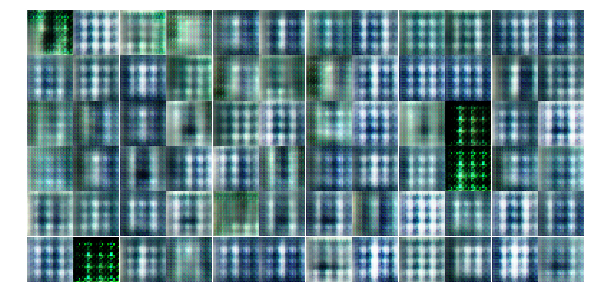

Epoch 6/50... Discriminator Loss: 0.6719... Generator Loss: 2.7781
Epoch 6/50... Discriminator Loss: 0.3924... Generator Loss: 1.7795
Epoch 6/50... Discriminator Loss: 0.4958... Generator Loss: 2.0999
Epoch 6/50... Discriminator Loss: 0.1182... Generator Loss: 3.5878
Epoch 6/50... Discriminator Loss: 0.2254... Generator Loss: 3.4268
Epoch 6/50... Discriminator Loss: 2.8806... Generator Loss: 0.5398
Epoch 6/50... Discriminator Loss: 1.4040... Generator Loss: 5.8818
Epoch 6/50... Discriminator Loss: 0.1829... Generator Loss: 5.1921
Epoch 6/50... Discriminator Loss: 0.2134... Generator Loss: 2.5611
Epoch 6/50... Discriminator Loss: 0.4527... Generator Loss: 1.5616


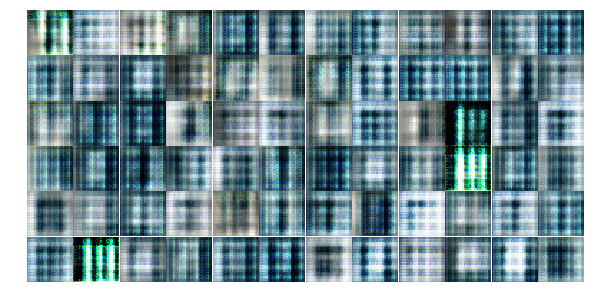

Epoch 6/50... Discriminator Loss: 2.2839... Generator Loss: 1.8403
Epoch 6/50... Discriminator Loss: 0.4484... Generator Loss: 1.6205
Epoch 6/50... Discriminator Loss: 0.3447... Generator Loss: 2.0740
Epoch 6/50... Discriminator Loss: 0.2870... Generator Loss: 2.2115
Epoch 6/50... Discriminator Loss: 0.2534... Generator Loss: 2.6813
Epoch 6/50... Discriminator Loss: 0.7761... Generator Loss: 1.0852
Epoch 6/50... Discriminator Loss: 2.5280... Generator Loss: 0.7077
Epoch 6/50... Discriminator Loss: 0.3917... Generator Loss: 1.9686
Epoch 6/50... Discriminator Loss: 0.8522... Generator Loss: 1.4121
Epoch 6/50... Discriminator Loss: 1.1776... Generator Loss: 1.3202


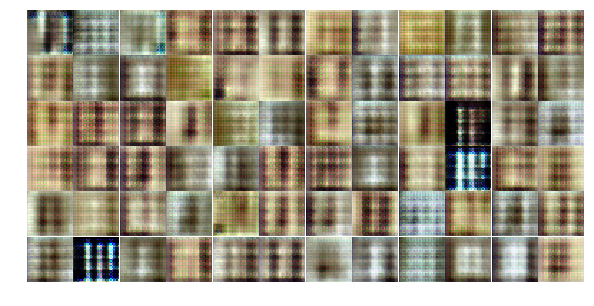

Epoch 6/50... Discriminator Loss: 0.3970... Generator Loss: 2.8799
Epoch 6/50... Discriminator Loss: 0.9753... Generator Loss: 2.3129
Epoch 6/50... Discriminator Loss: 0.1495... Generator Loss: 4.2173
Epoch 6/50... Discriminator Loss: 0.1044... Generator Loss: 3.6346
Epoch 6/50... Discriminator Loss: 0.2594... Generator Loss: 3.9449
Epoch 6/50... Discriminator Loss: 0.9719... Generator Loss: 1.6960
Epoch 6/50... Discriminator Loss: 1.1778... Generator Loss: 1.4185
Epoch 6/50... Discriminator Loss: 0.0698... Generator Loss: 4.4211
Epoch 6/50... Discriminator Loss: 0.6978... Generator Loss: 3.9736
Epoch 6/50... Discriminator Loss: 0.8270... Generator Loss: 1.2371


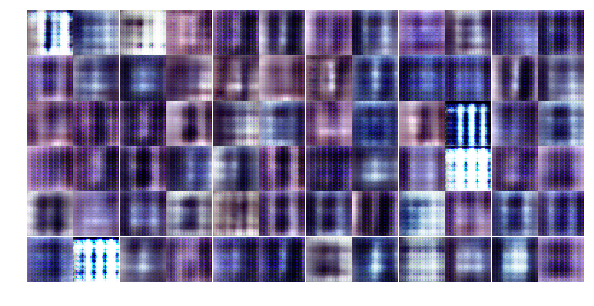

Epoch 6/50... Discriminator Loss: 0.0797... Generator Loss: 4.0694
Epoch 6/50... Discriminator Loss: 0.2772... Generator Loss: 3.4853
Epoch 6/50... Discriminator Loss: 0.1695... Generator Loss: 4.6249
Epoch 6/50... Discriminator Loss: 0.3457... Generator Loss: 3.7928
Epoch 6/50... Discriminator Loss: 0.5704... Generator Loss: 3.2502
Epoch 6/50... Discriminator Loss: 0.5245... Generator Loss: 2.6807
Epoch 6/50... Discriminator Loss: 0.0419... Generator Loss: 4.0439
Epoch 6/50... Discriminator Loss: 0.7293... Generator Loss: 1.4494
Epoch 6/50... Discriminator Loss: 1.2126... Generator Loss: 0.9493
Epoch 7/50... Discriminator Loss: 0.0636... Generator Loss: 5.2307


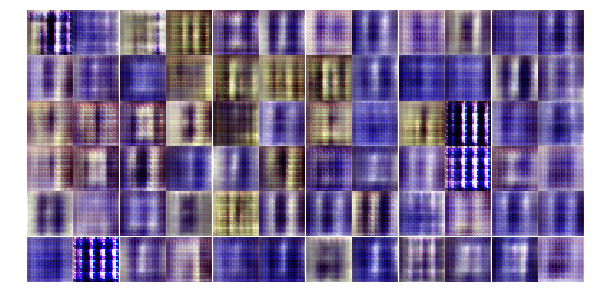

Epoch 7/50... Discriminator Loss: 0.8211... Generator Loss: 3.1277
Epoch 7/50... Discriminator Loss: 0.2723... Generator Loss: 2.2938
Epoch 7/50... Discriminator Loss: 0.2842... Generator Loss: 2.5445
Epoch 7/50... Discriminator Loss: 0.2387... Generator Loss: 2.5945
Epoch 7/50... Discriminator Loss: 0.5458... Generator Loss: 1.5334
Epoch 7/50... Discriminator Loss: 0.4365... Generator Loss: 2.2921
Epoch 7/50... Discriminator Loss: 0.4377... Generator Loss: 2.6171
Epoch 7/50... Discriminator Loss: 0.4412... Generator Loss: 2.4020
Epoch 7/50... Discriminator Loss: 0.4622... Generator Loss: 1.9696
Epoch 7/50... Discriminator Loss: 0.1217... Generator Loss: 2.8980


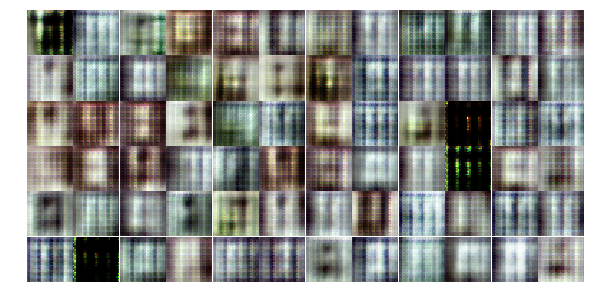

Epoch 7/50... Discriminator Loss: 0.2464... Generator Loss: 2.4673
Epoch 7/50... Discriminator Loss: 0.0684... Generator Loss: 4.6389
Epoch 7/50... Discriminator Loss: 0.2967... Generator Loss: 3.8849
Epoch 7/50... Discriminator Loss: 0.2567... Generator Loss: 3.0086
Epoch 7/50... Discriminator Loss: 0.0368... Generator Loss: 4.8419
Epoch 7/50... Discriminator Loss: 0.2833... Generator Loss: 4.2445
Epoch 7/50... Discriminator Loss: 0.1273... Generator Loss: 5.0523
Epoch 7/50... Discriminator Loss: 0.2633... Generator Loss: 4.2502
Epoch 7/50... Discriminator Loss: 0.5086... Generator Loss: 1.6443
Epoch 7/50... Discriminator Loss: 0.1917... Generator Loss: 4.9104


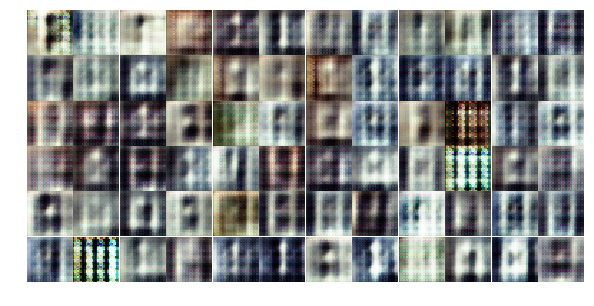

Epoch 7/50... Discriminator Loss: 0.1717... Generator Loss: 4.7092
Epoch 7/50... Discriminator Loss: 0.1528... Generator Loss: 5.6569
Epoch 7/50... Discriminator Loss: 0.2968... Generator Loss: 2.0730
Epoch 7/50... Discriminator Loss: 0.6105... Generator Loss: 1.4745
Epoch 7/50... Discriminator Loss: 0.6007... Generator Loss: 1.5917
Epoch 7/50... Discriminator Loss: 0.1617... Generator Loss: 3.3098
Epoch 7/50... Discriminator Loss: 0.2049... Generator Loss: 2.7494
Epoch 7/50... Discriminator Loss: 0.0387... Generator Loss: 4.2949
Epoch 7/50... Discriminator Loss: 0.0842... Generator Loss: 3.9681
Epoch 7/50... Discriminator Loss: 0.2909... Generator Loss: 2.2549


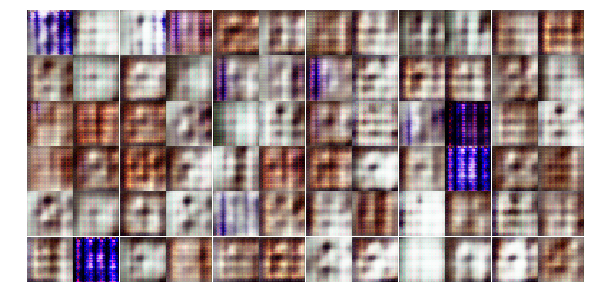

Epoch 7/50... Discriminator Loss: 0.2188... Generator Loss: 2.6049
Epoch 7/50... Discriminator Loss: 1.2957... Generator Loss: 1.6550
Epoch 7/50... Discriminator Loss: 1.1248... Generator Loss: 5.5911
Epoch 7/50... Discriminator Loss: 0.8538... Generator Loss: 8.3807
Epoch 7/50... Discriminator Loss: 0.2296... Generator Loss: 5.5052
Epoch 7/50... Discriminator Loss: 0.1266... Generator Loss: 3.6553
Epoch 7/50... Discriminator Loss: 0.1452... Generator Loss: 3.6826
Epoch 7/50... Discriminator Loss: 0.0903... Generator Loss: 3.0136
Epoch 7/50... Discriminator Loss: 1.2158... Generator Loss: 1.0144
Epoch 7/50... Discriminator Loss: 0.3087... Generator Loss: 3.3623


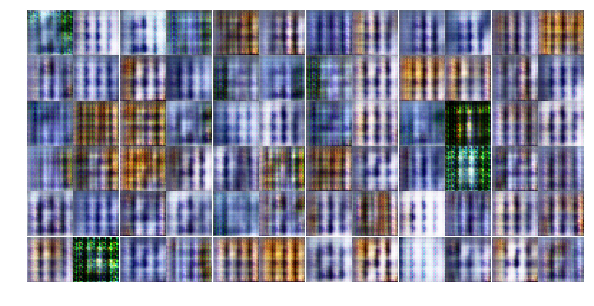

Epoch 7/50... Discriminator Loss: 0.3041... Generator Loss: 3.4586
Epoch 7/50... Discriminator Loss: 0.1283... Generator Loss: 4.0048
Epoch 7/50... Discriminator Loss: 0.0676... Generator Loss: 3.7713
Epoch 7/50... Discriminator Loss: 0.1884... Generator Loss: 2.7883
Epoch 7/50... Discriminator Loss: 0.1788... Generator Loss: 4.1056
Epoch 7/50... Discriminator Loss: 0.6595... Generator Loss: 4.7609
Epoch 7/50... Discriminator Loss: 1.2740... Generator Loss: 4.8990
Epoch 7/50... Discriminator Loss: 0.1848... Generator Loss: 4.7930
Epoch 7/50... Discriminator Loss: 0.0994... Generator Loss: 3.9820
Epoch 7/50... Discriminator Loss: 0.3139... Generator Loss: 1.9603


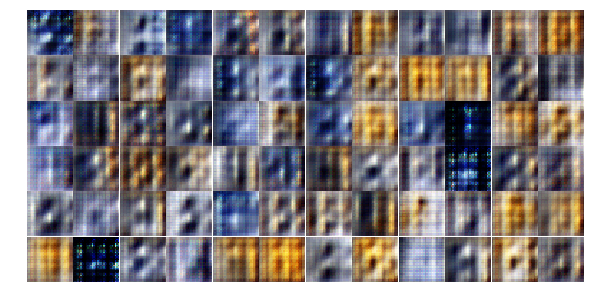

Epoch 7/50... Discriminator Loss: 0.5123... Generator Loss: 1.9743
Epoch 7/50... Discriminator Loss: 0.6838... Generator Loss: 2.7353
Epoch 7/50... Discriminator Loss: 0.4108... Generator Loss: 2.4854
Epoch 7/50... Discriminator Loss: 0.2091... Generator Loss: 3.9576
Epoch 7/50... Discriminator Loss: 0.3379... Generator Loss: 3.1888
Epoch 7/50... Discriminator Loss: 0.4652... Generator Loss: 1.9300
Epoch 7/50... Discriminator Loss: 0.5208... Generator Loss: 2.2560
Epoch 7/50... Discriminator Loss: 0.5288... Generator Loss: 2.3099
Epoch 7/50... Discriminator Loss: 0.6348... Generator Loss: 3.0980
Epoch 7/50... Discriminator Loss: 0.2608... Generator Loss: 2.9978


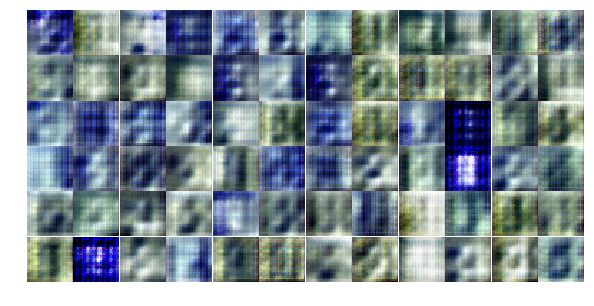

Epoch 7/50... Discriminator Loss: 0.1974... Generator Loss: 3.3641
Epoch 7/50... Discriminator Loss: 0.1685... Generator Loss: 3.7607
Epoch 7/50... Discriminator Loss: 0.1471... Generator Loss: 3.8400
Epoch 7/50... Discriminator Loss: 0.1209... Generator Loss: 4.2723
Epoch 7/50... Discriminator Loss: 0.1517... Generator Loss: 3.1091
Epoch 7/50... Discriminator Loss: 0.8093... Generator Loss: 1.3200
Epoch 7/50... Discriminator Loss: 0.2533... Generator Loss: 2.4575
Epoch 7/50... Discriminator Loss: 0.0907... Generator Loss: 4.3473
Epoch 7/50... Discriminator Loss: 0.7074... Generator Loss: 3.1166
Epoch 7/50... Discriminator Loss: 0.2264... Generator Loss: 3.3686


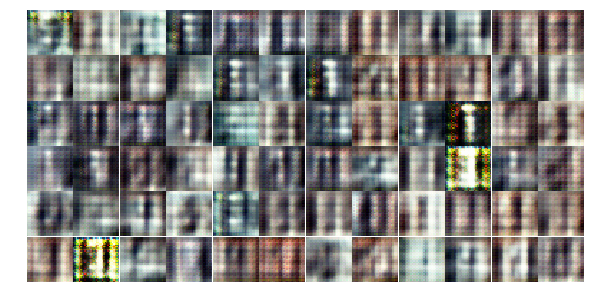

Epoch 7/50... Discriminator Loss: 0.8001... Generator Loss: 1.7783
Epoch 7/50... Discriminator Loss: 0.3553... Generator Loss: 3.5174
Epoch 7/50... Discriminator Loss: 0.2692... Generator Loss: 2.8133
Epoch 8/50... Discriminator Loss: 0.0326... Generator Loss: 4.7839
Epoch 8/50... Discriminator Loss: 0.0914... Generator Loss: 3.5065
Epoch 8/50... Discriminator Loss: 0.0277... Generator Loss: 4.5289
Epoch 8/50... Discriminator Loss: 0.1482... Generator Loss: 3.4692
Epoch 8/50... Discriminator Loss: 0.2696... Generator Loss: 3.0748
Epoch 8/50... Discriminator Loss: 1.0979... Generator Loss: 2.5931
Epoch 8/50... Discriminator Loss: 0.3796... Generator Loss: 2.5835


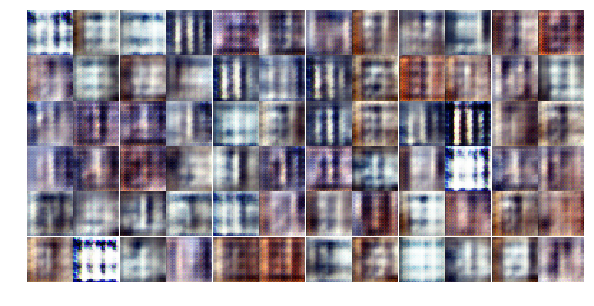

Epoch 8/50... Discriminator Loss: 0.2307... Generator Loss: 2.5453
Epoch 8/50... Discriminator Loss: 0.0626... Generator Loss: 4.0259
Epoch 8/50... Discriminator Loss: 0.2042... Generator Loss: 2.8712
Epoch 8/50... Discriminator Loss: 0.0565... Generator Loss: 4.5482
Epoch 8/50... Discriminator Loss: 0.3147... Generator Loss: 3.7604
Epoch 8/50... Discriminator Loss: 0.6612... Generator Loss: 4.5507
Epoch 8/50... Discriminator Loss: 0.3015... Generator Loss: 3.3093
Epoch 8/50... Discriminator Loss: 0.3340... Generator Loss: 2.4138
Epoch 8/50... Discriminator Loss: 1.0701... Generator Loss: 1.4541
Epoch 8/50... Discriminator Loss: 1.0459... Generator Loss: 2.5994


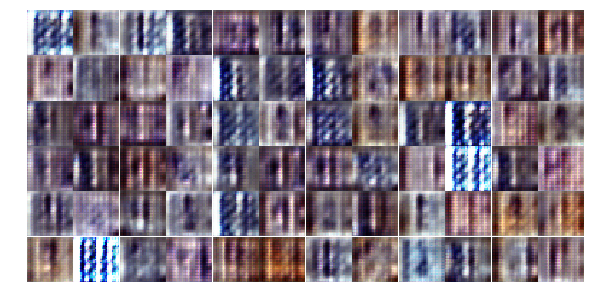

Epoch 8/50... Discriminator Loss: 0.2813... Generator Loss: 4.5407
Epoch 8/50... Discriminator Loss: 0.0928... Generator Loss: 4.9598
Epoch 8/50... Discriminator Loss: 0.6072... Generator Loss: 2.9035
Epoch 8/50... Discriminator Loss: 0.7361... Generator Loss: 3.8318
Epoch 8/50... Discriminator Loss: 1.2542... Generator Loss: 5.2829
Epoch 8/50... Discriminator Loss: 1.1201... Generator Loss: 2.5909
Epoch 8/50... Discriminator Loss: 0.2511... Generator Loss: 3.1860
Epoch 8/50... Discriminator Loss: 0.5889... Generator Loss: 2.1445
Epoch 8/50... Discriminator Loss: 0.2444... Generator Loss: 2.9040
Epoch 8/50... Discriminator Loss: 1.1229... Generator Loss: 2.2761


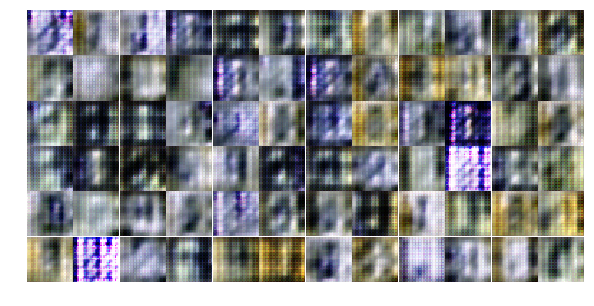

Epoch 8/50... Discriminator Loss: 0.2832... Generator Loss: 2.4045
Epoch 8/50... Discriminator Loss: 0.1078... Generator Loss: 3.3212
Epoch 8/50... Discriminator Loss: 0.2417... Generator Loss: 3.0101
Epoch 8/50... Discriminator Loss: 0.3999... Generator Loss: 5.3123
Epoch 8/50... Discriminator Loss: 0.2246... Generator Loss: 3.8736
Epoch 8/50... Discriminator Loss: 0.5122... Generator Loss: 2.5228
Epoch 8/50... Discriminator Loss: 0.7658... Generator Loss: 1.8516
Epoch 8/50... Discriminator Loss: 0.6733... Generator Loss: 3.2050
Epoch 8/50... Discriminator Loss: 0.3559... Generator Loss: 3.3777
Epoch 8/50... Discriminator Loss: 0.5298... Generator Loss: 1.6327


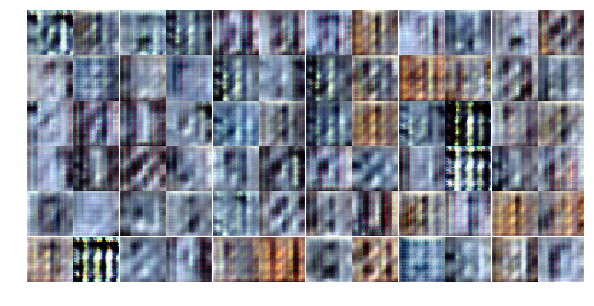

Epoch 8/50... Discriminator Loss: 0.4501... Generator Loss: 2.0752
Epoch 8/50... Discriminator Loss: 0.2109... Generator Loss: 3.5992
Epoch 8/50... Discriminator Loss: 0.2871... Generator Loss: 2.7762
Epoch 8/50... Discriminator Loss: 0.5850... Generator Loss: 4.0624
Epoch 8/50... Discriminator Loss: 0.5493... Generator Loss: 3.8305
Epoch 8/50... Discriminator Loss: 0.1220... Generator Loss: 3.0658
Epoch 8/50... Discriminator Loss: 0.3987... Generator Loss: 1.6238
Epoch 8/50... Discriminator Loss: 0.2267... Generator Loss: 3.2929
Epoch 8/50... Discriminator Loss: 0.7272... Generator Loss: 2.5021
Epoch 8/50... Discriminator Loss: 0.4448... Generator Loss: 3.2580


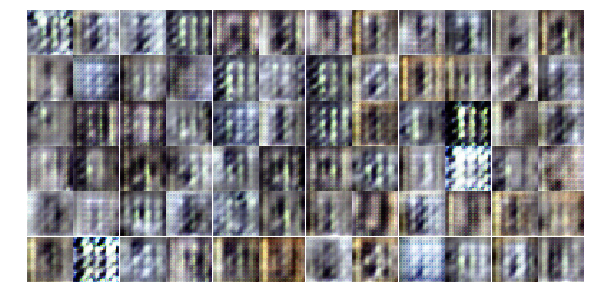

Epoch 8/50... Discriminator Loss: 0.4362... Generator Loss: 3.4110
Epoch 8/50... Discriminator Loss: 0.1623... Generator Loss: 3.7723
Epoch 8/50... Discriminator Loss: 0.9201... Generator Loss: 1.5597
Epoch 8/50... Discriminator Loss: 0.8562... Generator Loss: 1.3403
Epoch 8/50... Discriminator Loss: 0.3449... Generator Loss: 2.1109
Epoch 8/50... Discriminator Loss: 0.2152... Generator Loss: 3.3943
Epoch 8/50... Discriminator Loss: 0.4245... Generator Loss: 2.2330
Epoch 8/50... Discriminator Loss: 1.8419... Generator Loss: 1.6344
Epoch 8/50... Discriminator Loss: 0.6847... Generator Loss: 1.8989
Epoch 8/50... Discriminator Loss: 0.2181... Generator Loss: 3.5216


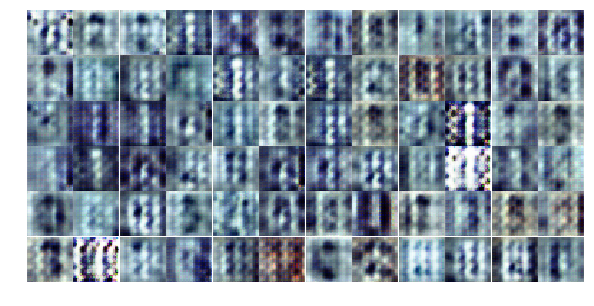

Epoch 8/50... Discriminator Loss: 0.6388... Generator Loss: 2.6583
Epoch 8/50... Discriminator Loss: 0.3426... Generator Loss: 2.9317
Epoch 8/50... Discriminator Loss: 0.9215... Generator Loss: 1.1722
Epoch 8/50... Discriminator Loss: 0.7084... Generator Loss: 2.4553
Epoch 8/50... Discriminator Loss: 1.1029... Generator Loss: 1.8647
Epoch 8/50... Discriminator Loss: 0.2210... Generator Loss: 3.4130
Epoch 8/50... Discriminator Loss: 0.1207... Generator Loss: 3.0624
Epoch 8/50... Discriminator Loss: 0.5944... Generator Loss: 1.8926
Epoch 8/50... Discriminator Loss: 0.8069... Generator Loss: 1.2685
Epoch 8/50... Discriminator Loss: 0.1273... Generator Loss: 3.8547


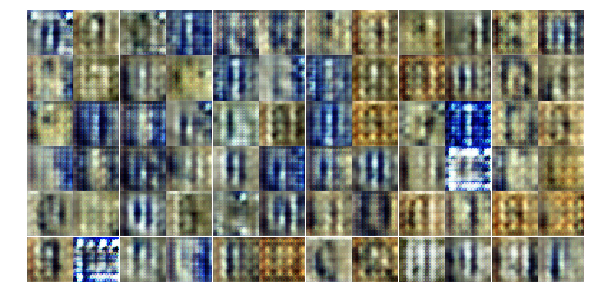

Epoch 8/50... Discriminator Loss: 0.1346... Generator Loss: 3.9169
Epoch 8/50... Discriminator Loss: 0.2375... Generator Loss: 3.5604
Epoch 8/50... Discriminator Loss: 0.3017... Generator Loss: 2.2980
Epoch 8/50... Discriminator Loss: 0.5528... Generator Loss: 2.9844
Epoch 8/50... Discriminator Loss: 3.2756... Generator Loss: 1.2801
Epoch 8/50... Discriminator Loss: 0.5210... Generator Loss: 1.9927
Epoch 9/50... Discriminator Loss: 0.4434... Generator Loss: 2.9186
Epoch 9/50... Discriminator Loss: 0.4424... Generator Loss: 2.6230
Epoch 9/50... Discriminator Loss: 0.4566... Generator Loss: 2.6619
Epoch 9/50... Discriminator Loss: 0.2756... Generator Loss: 2.7018


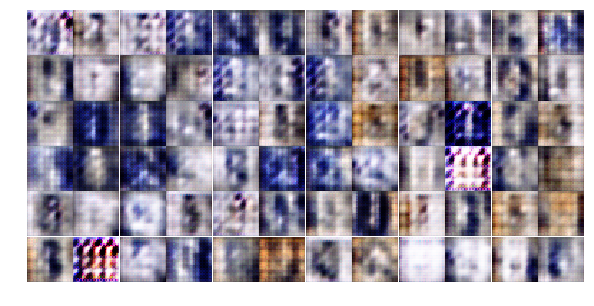

Epoch 9/50... Discriminator Loss: 0.5604... Generator Loss: 1.7592
Epoch 9/50... Discriminator Loss: 1.7488... Generator Loss: 0.7659
Epoch 9/50... Discriminator Loss: 1.7316... Generator Loss: 0.7438
Epoch 9/50... Discriminator Loss: 0.7413... Generator Loss: 1.8799
Epoch 9/50... Discriminator Loss: 0.4238... Generator Loss: 2.0635
Epoch 9/50... Discriminator Loss: 0.3815... Generator Loss: 2.0383
Epoch 9/50... Discriminator Loss: 0.3267... Generator Loss: 2.3633
Epoch 9/50... Discriminator Loss: 0.8338... Generator Loss: 1.8783
Epoch 9/50... Discriminator Loss: 1.2763... Generator Loss: 3.1947
Epoch 9/50... Discriminator Loss: 0.4469... Generator Loss: 4.0148


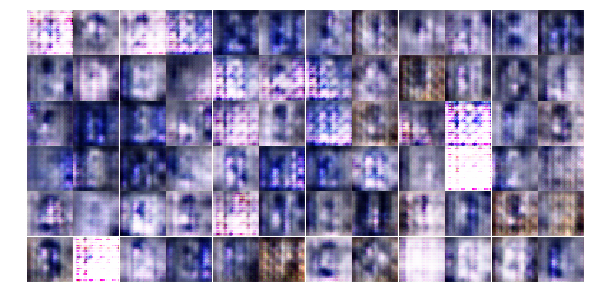

Epoch 9/50... Discriminator Loss: 0.2092... Generator Loss: 3.5188
Epoch 9/50... Discriminator Loss: 0.8663... Generator Loss: 1.8664
Epoch 9/50... Discriminator Loss: 1.0516... Generator Loss: 1.3734
Epoch 9/50... Discriminator Loss: 0.6432... Generator Loss: 2.2526
Epoch 9/50... Discriminator Loss: 0.5641... Generator Loss: 2.8528
Epoch 9/50... Discriminator Loss: 1.0860... Generator Loss: 1.7076
Epoch 9/50... Discriminator Loss: 0.7073... Generator Loss: 2.0691
Epoch 9/50... Discriminator Loss: 0.4617... Generator Loss: 3.6084
Epoch 9/50... Discriminator Loss: 0.4761... Generator Loss: 4.0057
Epoch 9/50... Discriminator Loss: 0.3098... Generator Loss: 3.3396


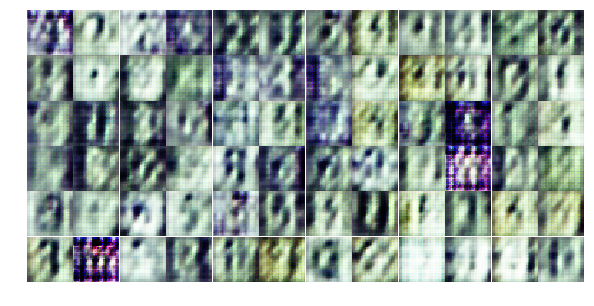

Epoch 9/50... Discriminator Loss: 0.2760... Generator Loss: 3.4203
Epoch 9/50... Discriminator Loss: 0.5039... Generator Loss: 3.1362
Epoch 9/50... Discriminator Loss: 0.9197... Generator Loss: 2.5609
Epoch 9/50... Discriminator Loss: 0.6646... Generator Loss: 2.0080
Epoch 9/50... Discriminator Loss: 0.1773... Generator Loss: 3.7771
Epoch 9/50... Discriminator Loss: 0.5524... Generator Loss: 1.5966
Epoch 9/50... Discriminator Loss: 0.4831... Generator Loss: 3.2353
Epoch 9/50... Discriminator Loss: 0.6927... Generator Loss: 4.0236
Epoch 9/50... Discriminator Loss: 1.0847... Generator Loss: 3.1120
Epoch 9/50... Discriminator Loss: 0.8315... Generator Loss: 2.0772


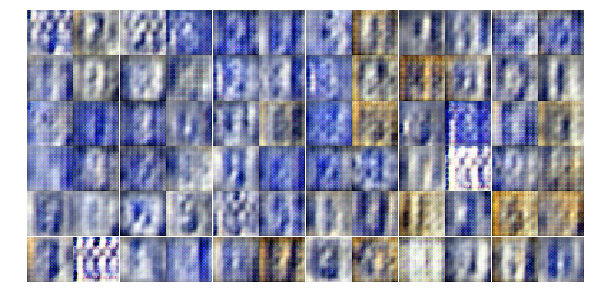

Epoch 9/50... Discriminator Loss: 0.2260... Generator Loss: 2.9693
Epoch 9/50... Discriminator Loss: 0.6955... Generator Loss: 1.4179
Epoch 9/50... Discriminator Loss: 0.6916... Generator Loss: 1.6138
Epoch 9/50... Discriminator Loss: 0.6218... Generator Loss: 3.1284
Epoch 9/50... Discriminator Loss: 0.1215... Generator Loss: 3.6385
Epoch 9/50... Discriminator Loss: 0.3105... Generator Loss: 2.9328
Epoch 9/50... Discriminator Loss: 0.4596... Generator Loss: 2.1461
Epoch 9/50... Discriminator Loss: 0.3215... Generator Loss: 3.4989
Epoch 9/50... Discriminator Loss: 0.6419... Generator Loss: 2.4289
Epoch 9/50... Discriminator Loss: 0.3463... Generator Loss: 3.3530


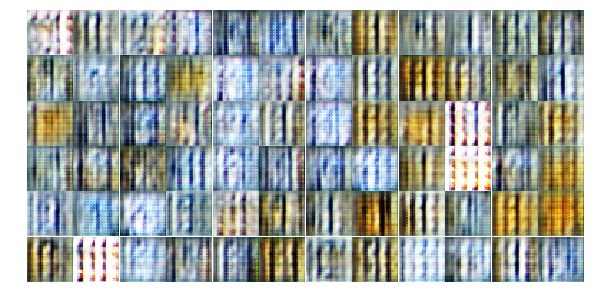

Epoch 9/50... Discriminator Loss: 0.2851... Generator Loss: 3.2336
Epoch 9/50... Discriminator Loss: 0.2625... Generator Loss: 3.3237
Epoch 9/50... Discriminator Loss: 0.2285... Generator Loss: 2.6247
Epoch 9/50... Discriminator Loss: 0.8611... Generator Loss: 3.5447
Epoch 9/50... Discriminator Loss: 2.1173... Generator Loss: 1.8962
Epoch 9/50... Discriminator Loss: 0.1579... Generator Loss: 3.4732
Epoch 9/50... Discriminator Loss: 0.3638... Generator Loss: 2.4317
Epoch 9/50... Discriminator Loss: 1.7404... Generator Loss: 0.6773


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))